In [1]:

import pandas as pd
import numpy as np
import sys
import os
import random
from pathlib import Path
import imageio
import skimage
import skimage.io
import skimage.transform
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
from PIL import Image
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import scipy
from sklearn.model_selection import train_test_split
from sklearn import metrics
from keras import optimizers
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, MaxPool2D, Dropout, BatchNormalization,LeakyReLU
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping, ReduceLROnPlateau, LearningRateScheduler
from keras.utils import to_categorical
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
import tensorflow


np.random.seed(42)

# Global variables
IMAGE_PATH = './Data/bee_imgs/bee_imgs/'
IMAGE_WIDTH = 100
IMAGE_HEIGHT = 100
IMAGE_CHANNELS = 3
RANDOM_STATE = 2018
TEST_SIZE = 0.2
VAL_SIZE = 0.2
CONV_2D_DIM_1 = 16
CONV_2D_DIM_2 = 16
CONV_2D_DIM_3 = 32
CONV_2D_DIM_4 = 64
MAX_POOL_DIM = 2
KERNEL_SIZE = 3
BATCH_SIZE = 32
NO_EPOCHS_1 = 5
NO_EPOCHS_2 = 10
NO_EPOCHS_3 = 50
PATIENCE = 5
VERBOSE = 1 

C:\Users\Mamoon\anaconda3\lib\site-packages\cupy\_environment.py:205: UserWarning: CUDA path could not be detected. Set CUDA_PATH environment variable if CuPy fails to load.
  warnings.warn(


## Exploring Image Manipulation with PIL (Python Imaging Library)

In this section, we are using the Python Imaging Library (PIL) to manipulate and process images. The goal is to learn various techniques for image manipulation and understand how to use PIL effectively.

### Loading and Displaying Images

We start by importing the necessary libraries and generating random test data for demonstration purposes. Then, we open an image using PIL, explore its size, and display it.


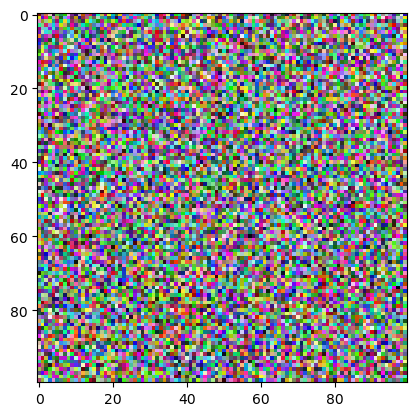

In [2]:
# generate test_data
test_data = np.random.beta(1, 1, size=(100, 100, 3))

# display the test_data
plt.imshow(test_data)


The image size is: (100, 100)


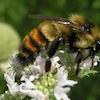

In [3]:
# open the image
img = Image.open('./Data/bee_1.jpg')

# Get the image size
img_size = img.size

print("The image size is: {}".format(img_size))

# Just having the image as the last line in the cell will display it in the notebook
img


## Basic Image Manipulations

We perform some basic image manipulations such as cropping, rotating, and flipping an image using PIL's built-in methods. These operations help us get familiar with the functionality of PIL.

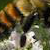

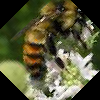

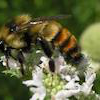

In [4]:
# Crop the image to 25, 25, 75, 75
img_cropped = img.crop((25, 25, 75, 75))
display(img_cropped)

# rotate the image by 45 degrees
img_rotated = img.rotate(45)
display(img_rotated)

# flip the image left to right
img_flipped = img.transpose(Image.FLIP_LEFT_RIGHT)
display(img_flipped)

### Converting Images and Exploring Channels

In this section, we delve into the process of image channel exploration and manipulation. We will convert the loaded image into a NumPy array to better understand its structure and then proceed to visualize its individual color channels. Additionally, we will introduce a function that allows us to create kernel density estimates (KDE) for the RGB channels.


Our NumPy array has the shape: (100, 100, 3)


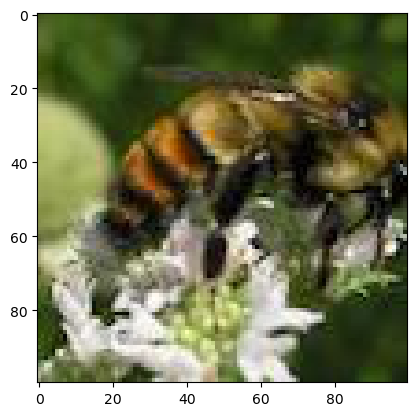

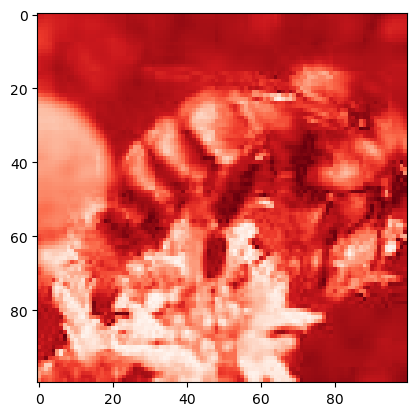

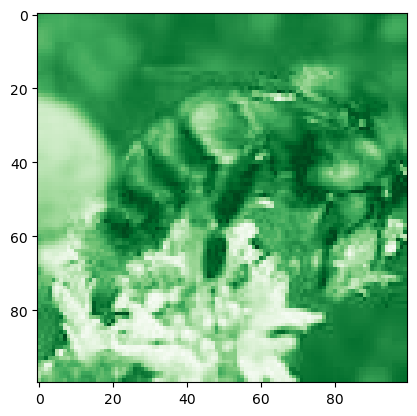

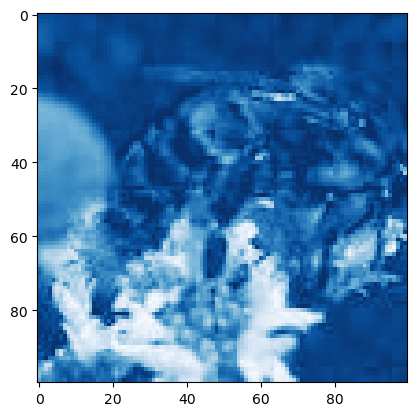

In [5]:
# Turn our image object into a NumPy array
img_data = np.array(img)

# get the shape of the resulting array
img_data_shape = img_data.shape

print("Our NumPy array has the shape: {}".format(img_data_shape))

# plot the data with `imshow` 
# ... YOUR CODE FOR TASK 4 ...
plt.imshow(img_data)
plt.show()

# plot the red channel
plt.imshow(img_data[:, :, 0], cmap=plt.cm.Reds_r)
plt.show()

# plot the green channel
plt.imshow(img_data[:, :, 1], cmap=plt.cm.Greens_r)
plt.show()

# plot the blue channel
plt.imshow(img_data[:, :, 2], cmap=plt.cm.Blues_r)
plt.show()


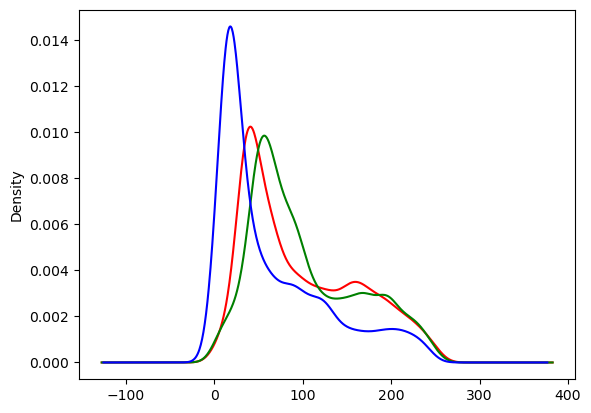

In [6]:
def plot_kde(channel, color):
    """ Plots a kernel density estimate for the given data.
        
        `channel` must be a 2d array
        `color` must be a color string, e.g. 'r', 'g', or 'b'
    """
    data = channel.flatten()
    return pd.Series(data).plot.density(c=color)

# create the list of channels
channels = ['r','g','b']
    
def plot_rgb(image_data):
    # use enumerate to loop over colors and indexes
    for ix, color in enumerate(channels):
        # ... YOUR CODE FOR TASK 5 ...
        plot_kde(img_data[:, :, ix], color)

    plt.show()
    
plot_rgb(img_data)


### Image Processing and Enhancements

This section focuses on various image processing techniques to enhance the visual characteristics of the images. We will apply grayscale conversion, image flipping, and contrast enhancement to specific bee images.


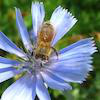

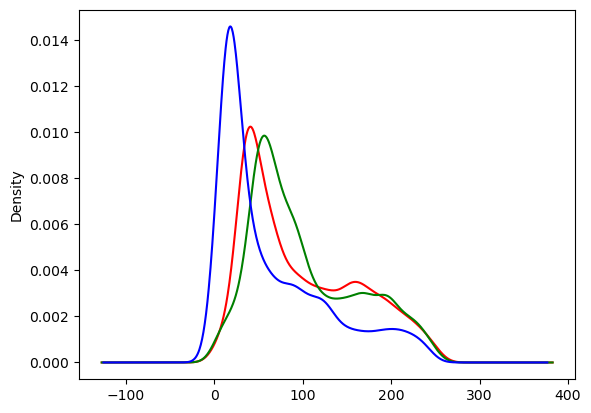

In [7]:
# load bee_12.jpg as honey
honey = Image.open('./Data/bee_12.jpg')

# display the honey bee image
display(honey)

# NumPy array of the honey bee image data
honey_data = np.array(honey)

# plot the rgb densities for the honey bee image
plot_rgb(honey_data)

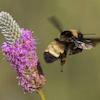

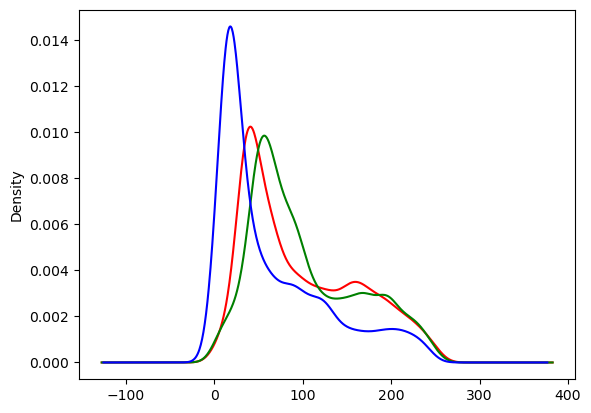

In [8]:
# load bee_3.jpg as bumble
bumble = Image.open('./Data/bee_3.jpg')

# display the bumble bee image
display(bumble)

# NumPy array of the bumble bee image data
bumble_data = np.array(bumble)

# plot the rgb densities for the bumble bee image
plot_rgb(bumble_data)


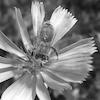

Our NumPy array has the shape: (100, 100)


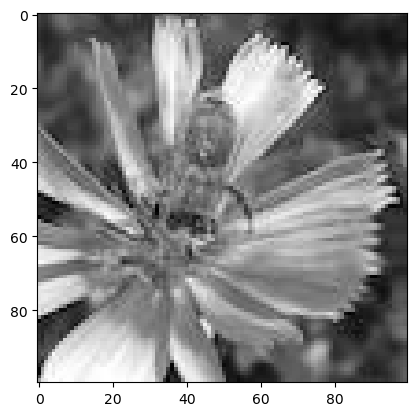

<AxesSubplot:ylabel='Density'>

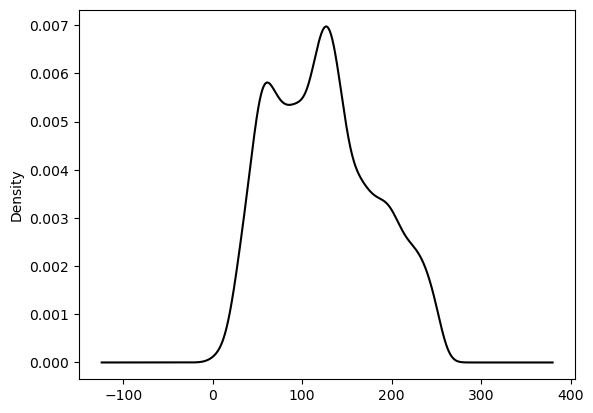

In [9]:
# convert honey to grayscale
honey_bw = honey.convert('L')
display(honey_bw)

# convert the image to a NumPy array
honey_bw_arr = np.array(honey_bw)

# get the shape of the resulting array
honey_bw_arr_shape = honey_bw_arr.shape
print("Our NumPy array has the shape: {}".format(honey_bw_arr_shape))

# plot the array using matplotlib
plt.imshow(honey_bw_arr, cmap=plt.cm.gray)
plt.show()

# plot the kde of the new black and white array
plot_kde(honey_bw_arr, 'k')

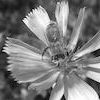

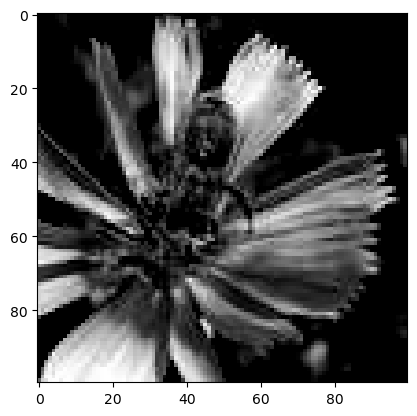

In [10]:
# flip the image left-right with transpose
honey_bw_flip = honey_bw.transpose(Image.FLIP_LEFT_RIGHT)

# show the flipped image
display(honey_bw_flip)

# save the flipped image
honey_bw_flip.save("./Output/bw_flipped.jpg")


# create higher contrast by reducing range
honey_hc_arr = np.maximum(honey_bw_arr, 100)

# show the higher contrast version
plt.imshow(honey_hc_arr, cmap=plt.cm.gray)

# convert the NumPy array of high contrast to an Image

honey_bw_hc = Image.fromarray(honey_hc_arr)

# save the high contrast version
honey_bw_hc.save("./Output/bw_hc.jpg")

## Batch Processing and Learning New Techniques

In this section, we demonstrate batch processing of multiple images using loops. We convert images to grayscale, apply rotations, cropping, and resizing, and save the processed images.


In [11]:
image_paths = ['./Data/bee_1.jpg', './Data/bee_12.jpg', './Data/bee_2.jpg', './Data/bee_3.jpg']

def process_image(path):
    img = Image.open(path)

    # create paths to save files to
    bw_path = "./Output/bw_{}.jpg".format(path.stem)
    rcz_path = "./Output/rcz_{}.jpg".format(path.stem)

    print("Creating grayscale version of {} and saving to {}.".format(path, bw_path))
    bw = img.convert()
    bw.save(bw_path)
    # ... YOUR CODE FOR TASK 10 ...

    print("Creating rotated, cropped, and zoomed version of {} and saving to {}.".format(path, rcz_path))
    rcz = img.rotate(45).crop((25, 25, 75, 75)).resize((100, 100))
    # ... YOUR CODE FOR TASK 10 ...
    rcz.save(rcz_path)
# for loop over image paths
for img_path in image_paths:
    process_image(Path(img_path))


Creating grayscale version of Data\bee_1.jpg and saving to ./Output/bw_bee_1.jpg.
Creating rotated, cropped, and zoomed version of Data\bee_1.jpg and saving to ./Output/rcz_bee_1.jpg.
Creating grayscale version of Data\bee_12.jpg and saving to ./Output/bw_bee_12.jpg.
Creating rotated, cropped, and zoomed version of Data\bee_12.jpg and saving to ./Output/rcz_bee_12.jpg.
Creating grayscale version of Data\bee_2.jpg and saving to ./Output/bw_bee_2.jpg.
Creating rotated, cropped, and zoomed version of Data\bee_2.jpg and saving to ./Output/rcz_bee_2.jpg.
Creating grayscale version of Data\bee_3.jpg and saving to ./Output/bw_bee_3.jpg.
Creating rotated, cropped, and zoomed version of Data\bee_3.jpg and saving to ./Output/rcz_bee_3.jpg.


## Building CNN Models for Bee Classification

In this section, we embark on the journey of building Convolutional Neural Network (CNN) models for two distinct classification tasks: Bee Subspecies Classification and Bee Health Classification. CNNs are particularly well-suited for image classification tasks, and we will leverage their power to categorize bee images accurately.

### Bee Subspecies Classification Model

For the Bee Subspecies Classification task, we aim to develop a CNN model that can differentiate between different subspecies of bees. We will define the architecture of the CNN, comprising Conv2D layers, MaxPooling layers, and Fully Connected (Dense) layers. The model's performance will be evaluated through metrics such as accuracy and loss.

### Bee Health Classification Model

In the Bee Health Classification task, our objective is to create a CNN model that can classify bees based on their health status. Healthy bees and those exhibiting signs of disease or stress will be classified into different categories. The model architecture will be constructed similarly to the subspecies classification model, with adjustments to the output layer to accommodate the different classes.

### Visualizing Kernels and Convolution

One of the fascinating aspects of CNNs is their ability to automatically learn and extract meaningful features from images through convolutional layers. We will explore this concept by visualizing the learned kernels within Conv2D layers and observing how they convolve with input images. This will provide insights into what features the network is focusing on during the learning process.

### Exploratory Data Analysis (EDA)

Before diving into model building, it's crucial to perform Exploratory Data Analysis (EDA) on the dataset. EDA involves a comprehensive examination of the dataset's properties, statistics, distributions, and relationships. By visualizing the data and gaining a deep understanding of its characteristics, we can make informed decisions during preprocessing, augmentation, and model design.

Throughout this section, we will combine theoretical knowledge with hands-on implementation, guiding you through the process of creating effective CNN models, understanding convolutional layers, and conducting thorough EDA. By the end of this section, you will be equipped with the skills to develop and fine-tune CNNs for bee classification tasks, with a strong foundation in both theory and practice.


# Data Import and Basic Data Cleaning

In this section, we start by importing the honey bee dataset and performing basic data cleaning operations to prepare it for analysis. We'll inspect the dataset's structure, check for missing values, and incorporate additional image-related information.


In [12]:
honey_bee_df=pd.read_csv('./Data/bee_data.csv')
honey_bee_df

,file,date,time,location,zip code,subspecies,health,pollen_carrying,caste
0,041_066.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,worker
1,041_072.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,worker
2,041_073.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,worker
3,041_067.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,worker
4,041_059.png,8/28/18,16:07,"Alvin, TX, USA",77511,-1,hive being robbed,False,worker
...,...,...,...,...,...,...,...,...,...
5167,027_011.png,8/20/18,10:03,"San Jose, CA, USA",95124,-1,healthy,True,worker
5168,027_007.png,8/20/18,10:03,"San Jose, CA, USA",95124,-1,healthy,True,worker
5169,027_013.png,8/20/18,10:03,"San Jose, CA, USA",95124,-1,healthy,False,worker
5170,027_012.png,8/20/18,10:03,"San Jose, CA, USA",95124,-1,healthy,False,worker


In [13]:
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data(honey_bee_df)

,Total,Percent
file,0,0.0
date,0,0.0
time,0,0.0
location,0,0.0
zip code,0,0.0
subspecies,0,0.0
health,0,0.0
pollen_carrying,0,0.0
caste,0,0.0


In [14]:
image_files = list(os.listdir(IMAGE_PATH))
print("Number of image files: {}".format(len(image_files)))

Number of image files: 5172


In [15]:
file_names = list(honey_bee_df['file'])
print("Matching image names: {}".format(len(set(file_names).intersection(image_files))))

Matching image names: 5172


## Exploratory Data Analysis (EDA) and Visualizations

In this section, we perform Exploratory Data Analysis (EDA) and create visualizations to gain insights into the honey bee dataset. We analyze various attributes of the dataset, including image dimensions, location, subspecies, health, and more.

In [16]:
def read_image_sizes(file_name):
    image = skimage.io.imread(IMAGE_PATH + file_name)
    return list(image.shape)

In [17]:
m = np.stack(honey_bee_df['file'].apply(read_image_sizes))
df = pd.DataFrame(m,columns=['w','h','c'])
honey_bee_df = pd.concat([honey_bee_df,df],axis=1, sort=False)

In [18]:
traceW = go.Box(
    x = honey_bee_df['w'],
    name="Width",
     marker=dict(
                color='rgba(238,23,11,0.5)',
                line=dict(
                    color='red',
                    width=1.2),
            ),
    orientation='h')
traceH = go.Box(
    x = honey_bee_df['h'],
    name="Height",
    marker=dict(
                color='rgba(11,23,245,0.5)',
                line=dict(
                    color='blue',
                    width=1.2),
            ),
    orientation='h')
data = [traceW, traceH]
layout = dict(title = 'Width & Heights of images',
          xaxis = dict(title = 'Size', showticklabels=True), 
          yaxis = dict(title = 'Image dimmension'),
          hovermode = 'closest',
         )
fig = dict(data=data, layout=layout)
iplot(fig, filename='width-height')

In [19]:
tmp = honey_bee_df.groupby(['zip code'])['location'].value_counts()
df = pd.DataFrame(data={'Images': tmp.values}, index=tmp.index).reset_index()
df

,zip code,location,Images
0,3431,"Keene, NH, USA",92
1,30607,"Athens, GA, USA",579
2,30607,"Athens, Georgia, USA",472
3,50315,"Des Moines, IA, USA",973
4,70115,"New Orleans, LA, USA",170
5,77511,"Alvin, TX, USA",737
6,95070,"Saratoga, CA, USA",2000
7,95124,"San Jose, CA, USA",149


In [20]:
honey_bee_df = honey_bee_df.replace({'location':'Athens, Georgia, USA'}, 'Athens, GA, USA')

In [21]:
tmp = honey_bee_df.groupby(['zip code'])['location'].value_counts()
df = pd.DataFrame(data={'Images': tmp.values}, index=tmp.index).reset_index()
df['code'] = df['location'].map(lambda x: x.split(',', 2)[1])
df

,zip code,location,Images,code
0,3431,"Keene, NH, USA",92,NH
1,30607,"Athens, GA, USA",1051,GA
2,50315,"Des Moines, IA, USA",973,IA
3,70115,"New Orleans, LA, USA",170,LA
4,77511,"Alvin, TX, USA",737,TX
5,95070,"Saratoga, CA, USA",2000,CA
6,95124,"San Jose, CA, USA",149,CA


In [22]:
trace = go.Bar(
        x = df['location'],
        y = df['Images'],
        marker=dict(color="Tomato"),
        text=df['location']
    )
data = [trace]
    
layout = dict(title = 'Number of bees images per location',
          xaxis = dict(title = 'Subspecies', showticklabels=True, tickangle=15), 
          yaxis = dict(title = 'Number of images'),
          hovermode = 'closest'
         )
fig = dict(data = data, layout = layout)
iplot(fig, filename='images-location')

In [23]:
#list of locations
locations = (honey_bee_df.groupby(['location'])['location'].nunique()).index


In [24]:
def draw_category_images(var,cols=5):
    categories = (honey_bee_df.groupby([var])[var].nunique()).index
    f, ax = plt.subplots(nrows=len(categories),ncols=cols, figsize=(2*cols,2*len(categories)))
    # draw a number of images for each location
    for i, cat in enumerate(categories):
        sample = honey_bee_df[honey_bee_df[var]==cat].sample(cols)
        for j in range(0,cols):
            file=IMAGE_PATH + sample.iloc[j]['file']
            im=imageio.imread(file)
            ax[i, j].imshow(im, resample=True)
            ax[i, j].set_title(cat, fontsize=9)  
    plt.tight_layout()
    plt.show()


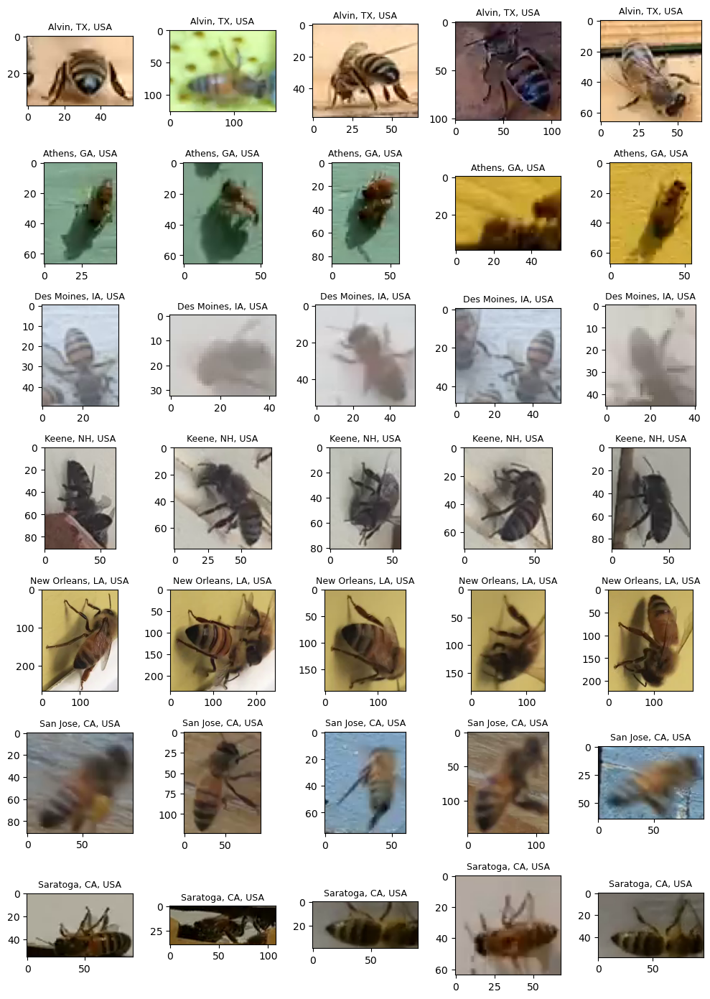

In [25]:
draw_category_images("location")

In [26]:
honey_bee_df['date_time'] = pd.to_datetime(honey_bee_df['date'] + ' ' + honey_bee_df['time'])
honey_bee_df["year"] = honey_bee_df['date_time'].dt.year
honey_bee_df["month"] = honey_bee_df['date_time'].dt.month
honey_bee_df["day"] = honey_bee_df['date_time'].dt.day
honey_bee_df["hour"] = honey_bee_df['date_time'].dt.hour
honey_bee_df["minute"] = honey_bee_df['date_time'].dt.minute

In [27]:
tmp = honey_bee_df.groupby(['date_time', 'hour'])['location'].value_counts()
df = pd.DataFrame(data={'Images': tmp.values}, index=tmp.index).reset_index()
hover_text = []
for index, row in df.iterrows():
    hover_text.append(('Date/time: {}<br>'+
                      'Hour: {}<br>'+
                      'Location: {}<br>'+
                      'Images: {}').format(row['date_time'],
                                            row['hour'],
                                            row['location'],
                                            row['Images']))
df['hover_text'] = hover_text
locations = (honey_bee_df.groupby(['location'])['location'].nunique()).index
data = []
for location in locations:
    dfL = df[df['location']==location]
    trace = go.Scatter(
        x = dfL['date_time'],y = dfL['hour'],
        name=location,
        marker=dict(
            symbol='circle',
            sizemode='area',
            sizeref=0.2,
            size=dfL['Images'],
            line=dict(
                width=2
            ),),
        mode = "markers",
        text=dfL['hover_text'],
    )
    data.append(trace)
    
layout = dict(title = 'Number of bees images per date, approx. hour and location',
          xaxis = dict(title = 'Date', showticklabels=True), 
          yaxis = dict(title = 'Hour'),
          hovermode = 'closest'
         )
fig = dict(data = data, layout = layout)

iplot(fig, filename='images-date_time')

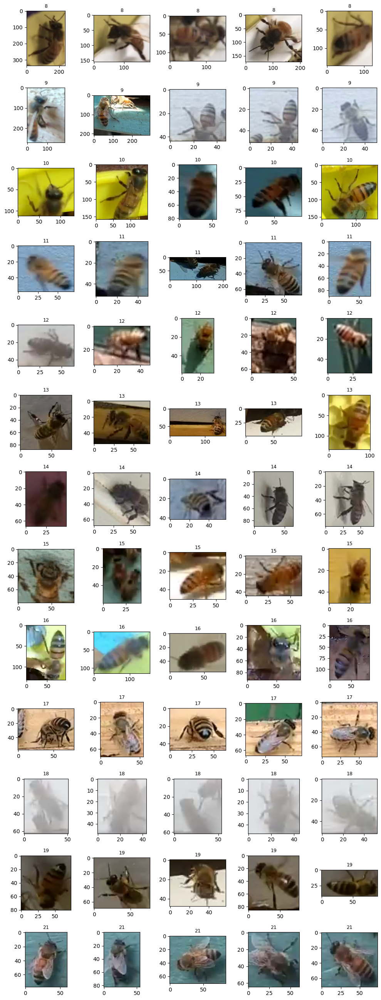

In [28]:
draw_category_images("hour")

In [29]:
tmp = honey_bee_df.groupby(['subspecies'])['year'].value_counts()
df = pd.DataFrame(data={'Images': tmp.values}, index=tmp.index).reset_index()
df

,subspecies,year,Images
0,-1,2018,428
1,1 Mixed local stock 2,2018,472
2,Carniolan honey bee,2018,501
3,Italian honey bee,2018,3008
4,Russian honey bee,2018,527
5,VSH Italian honey bee,2018,199
6,Western honey bee,2018,37


In [30]:
trace = go.Bar(
        x = df['subspecies'],
        y = df['Images'],
        marker=dict(color="Green"),
        text=df['subspecies']
    )
data = [trace]
    
layout = dict(title = 'Number of bees images per subspecies',
          xaxis = dict(title = 'Subspecies', showticklabels=True, tickangle=15), 
          yaxis = dict(title = 'Number of images'),
          hovermode = 'closest'
         )
fig = dict(data = data, layout = layout)
iplot(fig, filename='images-subspecies')

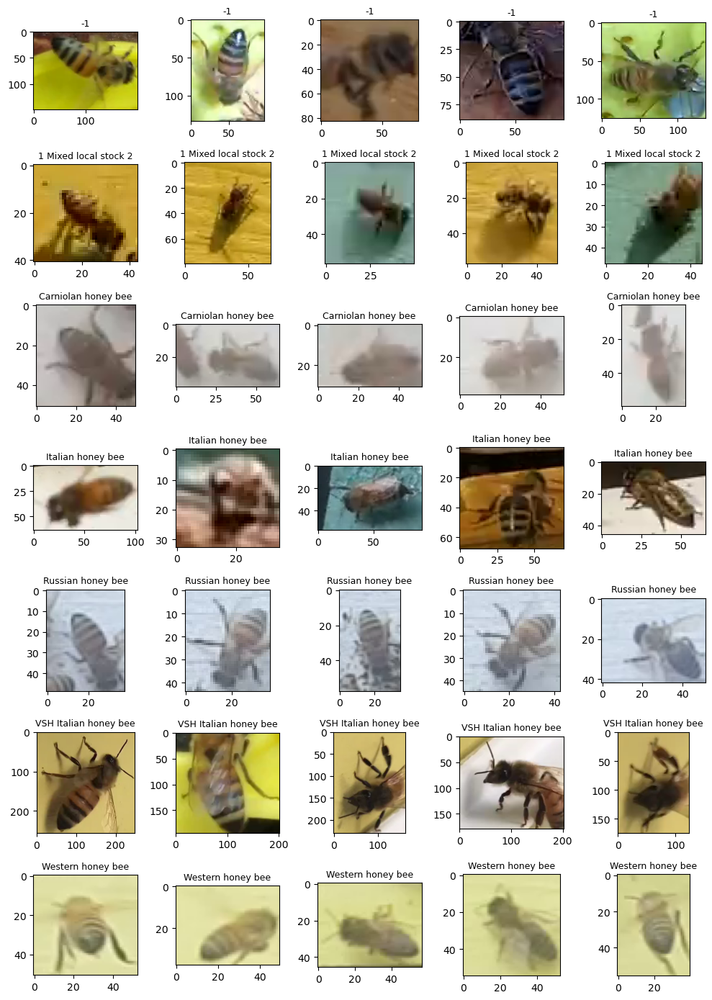

In [31]:
draw_category_images("subspecies")

In [32]:
tmp = honey_bee_df.groupby(['subspecies'])['location'].value_counts()
df = pd.DataFrame(data={'Images': tmp.values}, index=tmp.index).reset_index()

In [33]:
piv = pd.pivot_table(df, values="Images",index=["subspecies"], columns=["location"], fill_value=0)
m = piv.values

In [34]:
trace = go.Heatmap(z = m, y= list(piv.index), x=list(piv.columns),colorscale='Rainbow',reversescale=False)
    
data=[trace]
layout = dict(title = "Number of images per subspecies and location",
              xaxis = dict(title = 'Location',
                        showticklabels=True,
                           tickangle = 45,
                        tickfont=dict(
                                size=10,
                                color='black'),
                          ),
              yaxis = dict(title = 'Subspecies', 
                        showticklabels=True, 
                           tickangle = 45,
                        tickfont=dict(
                            size=10,
                            color='black'),
                      ), 
              hovermode = 'closest',
              showlegend=False,
                  width=600,
                  height=600,
             )
fig = dict(data = data, layout = layout)
iplot(fig, filename='images-location_subspecies')

In [35]:
tmp = honey_bee_df.groupby(['subspecies'])['hour'].value_counts()
df = pd.DataFrame(data={'Images': tmp.values}, index=tmp.index).reset_index()

In [36]:
piv = pd.pivot_table(df, values="Images",index=["subspecies"], columns=["hour"], fill_value=0)
m = piv.values

In [37]:
trace = go.Heatmap(z = m, y= list(piv.index), x=list(piv.columns),colorscale='Rainbow',reversescale=False)
    
data=[trace]
layout = dict(title = "Number of images per subspecies and hour",
              xaxis = dict(title = 'Hour',
                        showticklabels=True,
                           tickangle = 0,
                        tickfont=dict(
                                size=10,
                                color='black'),
                          ),
              yaxis = dict(title = 'Subspecies', 
                        showticklabels=True, 
                           tickangle = 45,
                        tickfont=dict(
                            size=10,
                            color='black'),
                      ), 
              hovermode = 'closest',
              showlegend=False,
                  width=600,
                  height=600,
             )
fig = dict(data = data, layout = layout)
iplot(fig, filename='images-location_subspecies')


In [38]:
def draw_trace_box(dataset,var, subspecies):
    dfS = dataset[dataset['subspecies']==subspecies];
    trace = go.Box(
        x = dfS[var],
        name=subspecies,
        marker=dict(
                    line=dict(
                        color='black',
                        width=0.8),
                ),
        text=dfS['subspecies'], 
        orientation = 'h'
    )
    return trace

subspecies = (honey_bee_df.groupby(['subspecies'])['subspecies'].nunique()).index
def draw_group(dataset, var, title,height=500):
    data = list()
    for subs in subspecies:
        data.append(draw_trace_box(dataset, var, subs))
        
    layout = dict(title = title,
              xaxis = dict(title = 'Size',showticklabels=True),
              yaxis = dict(title = 'Subspecies', showticklabels=True, tickfont=dict(
                family='Old Standard TT, serif',
                size=8,
                color='black'),), 
              hovermode = 'closest',
              showlegend=False,
                  width=600,
                  height=height,
             )
    fig = dict(data=data, layout=layout)
    iplot(fig, filename='subspecies-image')


draw_group(honey_bee_df, 'w', "Width of images per subspecies")
draw_group(honey_bee_df, 'h', "Height of images per subspecies")

In [39]:
def draw_trace_scatter(dataset, subspecies):
    dfS = dataset[dataset['subspecies']==subspecies];
    trace = go.Scatter(
        x = dfS['w'],y = dfS['h'],
        name=subspecies,
        mode = "markers",
        marker = dict(opacity=0.8),
        text=dfS['subspecies'], 
    )
    return trace

subspecies = (honey_bee_df.groupby(['subspecies'])['subspecies'].nunique()).index
def draw_group(dataset, title,height=600):
    data = list()
    for subs in subspecies:
        data.append(draw_trace_scatter(dataset, subs))
        
    layout = dict(title = title,
              xaxis = dict(title = 'Width',showticklabels=True),
              yaxis = dict(title = 'Height', showticklabels=True, tickfont=dict(
                family='Old Standard TT, serif',
                size=8,
                color='black'),), 
              hovermode = 'closest',
              showlegend=True,
                  width=800,
                  height=height,
             )
    fig = dict(data=data, layout=layout)
    iplot(fig, filename='subspecies-image')


draw_group(honey_bee_df,  "Width and height of images per subspecies")

In [40]:
tmp = honey_bee_df.groupby(['health'])['year'].value_counts()
df = pd.DataFrame(data={'Images': tmp.values}, index=tmp.index).reset_index()
df

,health,year,Images
0,"Varroa, Small Hive Beetles",2018,472
1,ant problems,2018,457
2,"few varrao, hive beetles",2018,579
3,healthy,2018,3384
4,hive being robbed,2018,251
5,missing queen,2018,29


In [41]:
trace = go.Bar(
        x = df['health'],
        y = df['Images'],
        marker=dict(color="Red"),
        text=df['health']
    )
data = [trace]
    
layout = dict(title = 'Number of bees images per health',
          xaxis = dict(title = 'Health', showticklabels=True, tickangle=15), 
          yaxis = dict(title = 'Number of images'),
          hovermode = 'closest'
         )
fig = dict(data = data, layout = layout)
iplot(fig, filename='images-health')

In [42]:
tmp = honey_bee_df.groupby(['subspecies'])['health'].value_counts()
df = pd.DataFrame(data={'Images': tmp.values}, index=tmp.index).reset_index()
df

,subspecies,health,Images
0,-1,hive being robbed,251
1,-1,healthy,177
2,1 Mixed local stock 2,"Varroa, Small Hive Beetles",472
3,Carniolan honey bee,healthy,501
4,Italian honey bee,healthy,1972
5,Italian honey bee,"few varrao, hive beetles",579
6,Italian honey bee,ant problems,457
7,Russian honey bee,healthy,527
8,VSH Italian honey bee,healthy,170
9,VSH Italian honey bee,missing queen,29


In [43]:
piv = pd.pivot_table(df, values="Images",index=["subspecies"], columns=["health"], fill_value=0)
m = piv.values

In [44]:
trace = go.Heatmap(z = m, y= list(piv.index), x=list(piv.columns),colorscale='Rainbow',reversescale=False)
    
data=[trace]
layout = dict(title = "Number of images per subspecies and health",
              xaxis = dict(title = 'Subspecies',
                        showticklabels=True,
                           tickangle = 45,
                        tickfont=dict(
                                size=10,
                                color='black'),
                          ),
              yaxis = dict(title = 'Health', 
                        showticklabels=True, 
                           tickangle = 45,
                        tickfont=dict(
                            size=10,
                            color='black'),
                      ), 
              hovermode = 'closest',
              showlegend=False,
                  width=600,
                  height=600,
             )
fig = dict(data = data, layout = layout)
iplot(fig, filename='images-health_subspecies')

In [45]:
tmp = honey_bee_df.groupby(['health', 'location'])['subspecies'].value_counts()
df = pd.DataFrame(data={'Images': tmp.values}, index=tmp.index).reset_index()
hover_text = []
for index, row in df.iterrows():
    hover_text.append(('Subspecies: {}<br>'+
                      'Health: {}<br>'+
                      'Location: {}<br>'+
                      'Images: {}').format(row['subspecies'],
                                            row['health'],
                                            row['location'],
                                            row['Images']))
df['hover_text'] = hover_text
subspecies = (honey_bee_df.groupby(['subspecies'])['subspecies'].nunique()).index
data = []
for subs in subspecies:
    dfL = df[df['subspecies']==subs]
    trace = go.Scatter(
        x = dfL['location'],y = dfL['health'],
        name=subs,
        marker=dict(
            symbol='circle',
            sizemode='area',
            sizeref=0.2,
            size=dfL['Images'],
            line=dict(
                width=2
            ),),
        mode = "markers",
        text=dfL['hover_text'],
    )
    data.append(trace)
    
layout = dict(title = 'Number of bees images per location, health and subspecies',
          xaxis = dict(title = 'Location', showticklabels=True), 
          yaxis = dict(title = 'Health', tickangle=45),
          hovermode = 'closest'
         )
fig = dict(data = data, layout = layout)
iplot(fig, filename='images-subspecies-health-location')


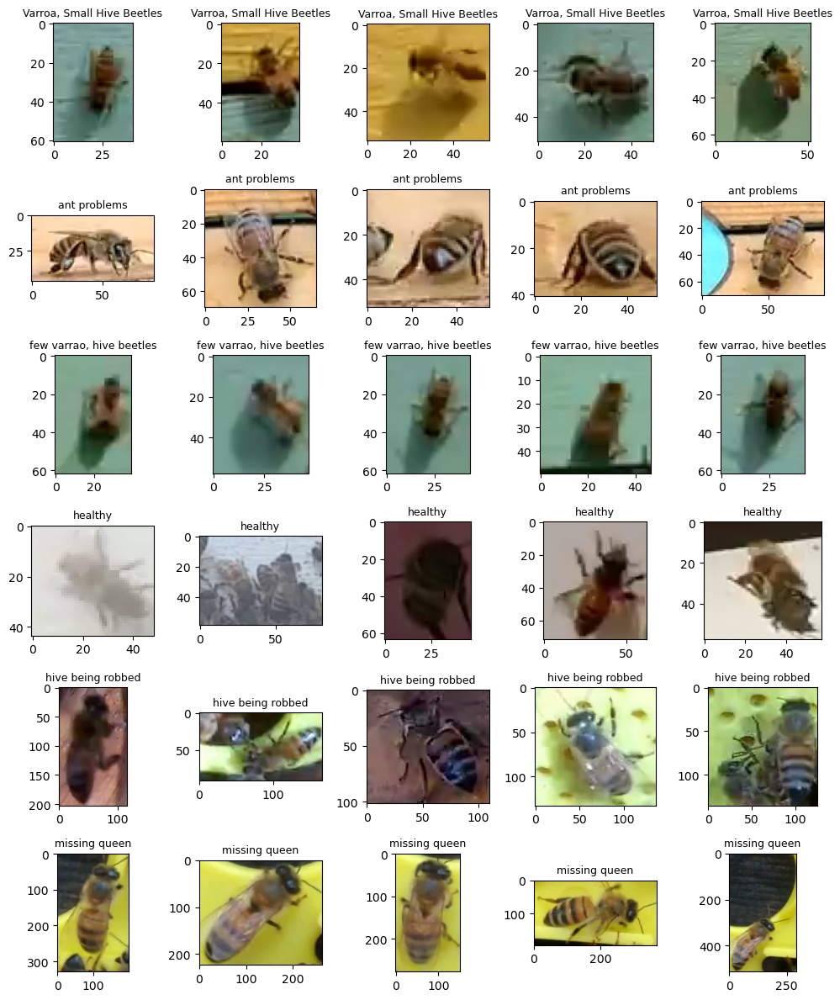

In [46]:
draw_category_images("health")

In [47]:
tmp = honey_bee_df.groupby(['pollen_carrying'])['year'].value_counts()
df = pd.DataFrame(data={'Images': tmp.values}, index=tmp.index).reset_index()
df

,pollen_carrying,year,Images
0,False,2018,5154
1,True,2018,18


In [48]:
tmp = honey_bee_df.groupby(['pollen_carrying'])['subspecies'].value_counts()
df = pd.DataFrame(data={'Images': tmp.values}, index=tmp.index).reset_index()
df[df['pollen_carrying']==True]

,pollen_carrying,subspecies,Images
7,True,-1,12
8,True,Italian honey bee,6


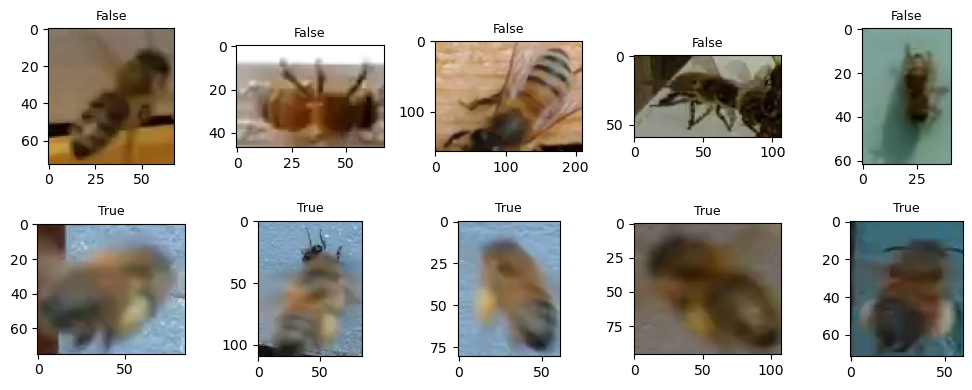

In [49]:
draw_category_images("pollen_carrying")

In [50]:
honey_bee_df.groupby(['caste'])['caste'].nunique()

caste
worker    1
Name: caste, dtype: int64

# CNN for Honey Bee Subspecies Classification

In this code, we build and train a Convolutional Neural Network (CNN) using Keras for classifying honey bee subspecies. The goal is to achieve accurate classification of different bee subspecies based on their images.

## Data Splitting and Balancing

The initial step involves splitting the dataset into training, validation, and test sets. The dataset is also balanced based on the 'subspecies' field. The `split_balance` function performs these operations.

## Image Loading and Preprocessing

Images are loaded and preprocessed using the `read_img` function. The images are resized to a common width, height, and channel configuration. The `prepare2train` function is used to prepare the data for training by loading images as features and one-hot encoding the labels.

## Model Architecture

The CNN model architecture is defined using the Sequential API from Keras. It consists of multiple layers, including convolutional and pooling layers, followed by a fully connected layer for classification. The model is compiled with an optimizer ('adam') and a loss function ('categorical_crossentropy').

## Model Training

The training process involves using the `fit_generator` method to train the model on the prepared data. Data augmentation is applied using the `ImageDataGenerator` to enhance the model's generalization. The training is monitored using the EarlyStopping callback, and the best model weights are saved using the ModelCheckpoint callback.

## Model Evaluation

After training, the model is evaluated using the `eval_model` function. This function generates plots for loss and accuracy during training, displays accuracy by subspecies, and provides a detailed classification report. The report includes metrics like precision, recall, F1-score, and support for each class.

## Results

The model achieved an accuracy of approximately 81% on the test dataset. The classification report and evaluation metrics provide insights into the model's performance for each subspecies class.


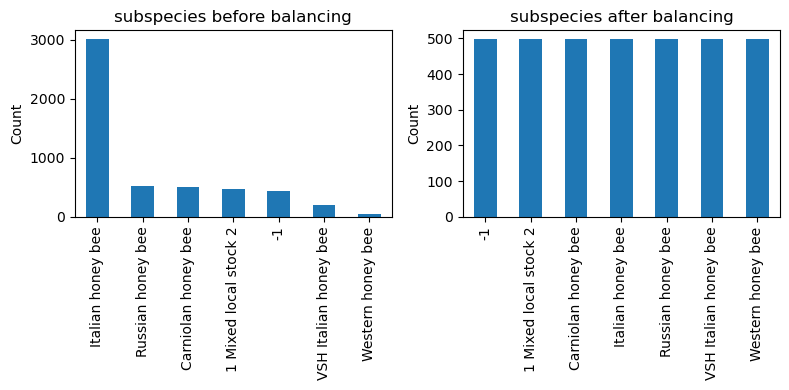

In [51]:
def split_balance(honey_bee_df, field_name):
    """ 
    Split to train, test and validation. 
    Then balance train by given field name.
    Draw plots before and after balancing
    
    @param honey_bee_df: Total Bees dataset to balance and split
    @param field_name: Field to balance by
    @return:  balanced train bees, validation bees, test bees
    """
    # Convert the field_name column to 'category' dtype
    honey_bee_df[field_name] = honey_bee_df[field_name].astype('category')

    # Split to train and test before balancing
    train_bees, test_bees = train_test_split(honey_bee_df, random_state=24)

    # Split train to train and validation datasets
    # Validation for use during learning
    train_bees, val_bees = train_test_split(train_bees, test_size=0.1, random_state=24)

    # Balance by subspecies to train_bees_bal dataset
    # Number of samples in each category
    ncat_bal = int(len(train_bees)/train_bees[field_name].cat.categories.size)
    train_bees_bal = train_bees.groupby(field_name, as_index=False).apply(lambda g:  g.sample(ncat_bal, replace=True)).reset_index(drop=True)
    return train_bees_bal, val_bees, test_bees

def plot_balanced(train_bees, train_bees_bal, field_name):
    """
    Draw distribution of field by categories before and after balancing
    @param train_bees: before balancing
    @param train_bees_bal: after balancing
    @param field_name: balancing field
    """
    # Plot before and after balancing
    f, axs = plt.subplots(1,2, figsize=(8,4))

    # Before
    ax = train_bees[field_name].value_counts().plot(kind='bar', ax=axs[0])
    ax.set_title('%s before balancing' % field_name)
    ax.set_ylabel('Count')

    # After
    ax = train_bees_bal[field_name].value_counts().plot(kind='bar', ax=axs[1])
    ax.set_title('%s after balancing' % field_name)
    ax.set_ylabel('Count')

    plt.tight_layout()
    plt.show()

# Split/balance and plot the result
train_bees_bal, val_bees, test_bees = split_balance(honey_bee_df, 'subspecies')
plot_balanced(honey_bee_df, train_bees_bal, 'subspecies')

# Will use balanced dataset as the main
train_bees = train_bees_bal


In [52]:
def read_img(file):
    """
    Read and resize img, adjust channels. 
    Caution: This function is not independent, it uses global vars: img_folder, img_channels
    @param file: file name without full path
    """
    img = skimage.io.imread(IMAGE_PATH + file)
    img = skimage.transform.resize(img, (IMAGE_WIDTH , IMAGE_HEIGHT ), mode='reflect')
    return img[:,:,:IMAGE_CHANNELS ]


# The same way of loading images and one hot encoding will be used in 2 places: subspecies and health CNN.
# Let's put this logic in function here to reuse.
def prepare2train(train_bees, val_bees, test_bees, field_name):
    """
    Load images for features, drop other columns
    One hot encode for label, drop other columns
    @return: image generator, train images, validation images, test images, train labels, validation labels, test labels
    """
    # Bees already splitted to train, validation and test
    # Load and transform images to have equal width/height/channels. 
    # read_img function is defined in the beginning to use in both health and subspecies. 
    # Use np.stack to get NumPy array for CNN input

    # Train data
    train_X = np.stack(train_bees['file'].apply(read_img))
    #train_y = to_categorical(train_bees[field_name].values)
    train_y  = pd.get_dummies(train_bees[field_name], drop_first=False)

    # Validation during training data to calc val_loss metric
    val_X = np.stack(val_bees['file'].apply(read_img))
    #val_y = to_categorical(val_bees[field_name].values)
    val_y = pd.get_dummies(val_bees[field_name], drop_first=False)

    # Test data
    test_X = np.stack(test_bees['file'].apply(read_img))
    #test_y = to_categorical(test_bees[field_name].values)
    test_y = pd.get_dummies(test_bees[field_name], drop_first=False)

    # Data augmentation - a little bit rotate, zoom and shift input images.
    generator = ImageDataGenerator(
            featurewise_center=False,  # set input mean to 0 over the dataset
            samplewise_center=False,  # set each sample mean to 0
            featurewise_std_normalization=False,  # divide inputs by std of the dataset
            samplewise_std_normalization=False,  # divide each input by its std
            zca_whitening=False,  # apply ZCA whitening
            rotation_range=180,  # randomly rotate images in the range (degrees, 0 to 180)
            zoom_range = 0.1, # Randomly zoom image 
            width_shift_range=0.2,  # randomly shift images horizontally (fraction of total width)
            height_shift_range=0.2,  # randomly shift images vertically (fraction of total height)
            horizontal_flip=True,  # randomly flip images
            vertical_flip=True)
    generator.fit(train_X)
    return (generator, train_X, val_X, test_X, train_y, val_y, test_y)

#train_bees['subspecies'].cat.values[:-100]
# Call image preparation and one hot encoding
generator, train_X, val_X, test_X, train_y, val_y, test_y = prepare2train(train_bees, val_bees, test_bees, 'subspecies')

In [53]:
# We'll stop training if no improvement after some epochs
earlystopper1 = EarlyStopping(monitor='loss', patience=10, verbose=1)

# Save the best model during the traning
checkpointer1 = ModelCheckpoint('best_model1.h5'
                                ,monitor='val_acc'
                                ,verbose=1
                                ,save_best_only=True
                                ,save_weights_only=True)
# Build CNN model
model1=Sequential()
model1.add(Conv2D(6, kernel_size=3, input_shape=(IMAGE_WIDTH , IMAGE_HEIGHT ,3), activation='relu', padding='same'))
model1.add(MaxPool2D(2))
model1.add(Conv2D(12, kernel_size=3, activation='relu', padding='same'))
model1.add(Flatten())
model1.add(Dense(train_y.columns.size, activation='softmax'))
model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train
training1 = model1.fit_generator(generator.flow(train_X,train_y, batch_size=60)
                        ,epochs=20
                        ,validation_data=[val_X, val_y]
                        ,steps_per_epoch=50
                        ,callbacks=[earlystopper1, checkpointer1])


C:\Users\Mamoon\AppData\Local\Temp\ipykernel_27176\1169532298.py:20: UserWarning:

`Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.



Epoch 1/20
50/50 [==============================] - 5s 85ms/step - loss: 1.1874 - accuracy: 0.5706 - val_loss: 1.0281 - val_accuracy: 0.5412
Epoch 2/20
50/50 [==============================] - 4s 84ms/step - loss: 0.6789 - accuracy: 0.7627 - val_loss: 0.6955 - val_accuracy: 0.6727
Epoch 3/20
50/50 [==============================] - 4s 83ms/step - loss: 0.5644 - accuracy: 0.7980 - val_loss: 0.7135 - val_accuracy: 0.7036
Epoch 4/20
50/50 [==============================] - 4s 84ms/step - loss: 0.4892 - accuracy: 0.8306 - val_loss: 0.9408 - val_accuracy: 0.6160
Epoch 5/20
50/50 [==============================] - 4s 84ms/step - loss: 0.4386 - accuracy: 0.8489 - val_loss: 0.5845 - val_accuracy: 0.7371
Epoch 6/20
50/50 [==============================] - 4s 84ms/step - loss: 0.4090 - accuracy: 0.8476 - val_loss: 0.6926 - val_accuracy: 0.7139
Epoch 7/20
50/50 [==============================] - 4s 84ms/step - loss: 0.3653 - accuracy: 0.8720 - val_loss: 0.8235 - val_accuracy: 0.7062
Epoch 8/20
50

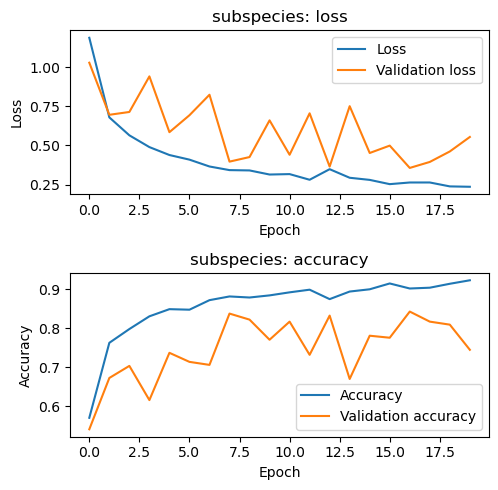

41/41 [==============================] - 0s 7ms/step


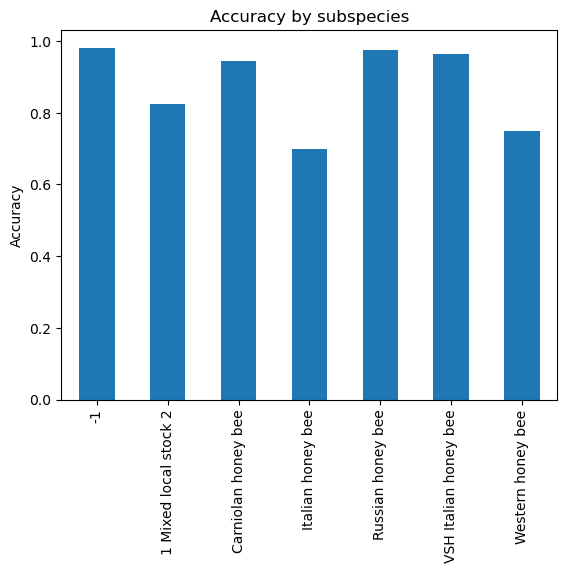

Classification report
                       precision    recall  f1-score   support

                   -1       0.51      0.98      0.67       108
1 Mixed local stock 2       0.49      0.82      0.61       102
  Carniolan honey bee       0.99      0.95      0.97       147
    Italian honey bee       0.97      0.71      0.82       754
    Russian honey bee       0.94      0.98      0.96       124
VSH Italian honey bee       0.63      0.96      0.76        54
    Western honey bee       1.00      0.75      0.86         4

             accuracy                           0.81      1293
            macro avg       0.79      0.88      0.81      1293
         weighted avg       0.88      0.81      0.82      1293

Loss function: 0.46260330080986023, accuracy: 0.8074246048927307


In [54]:
def eval_model(training, model, test_X, test_y, field_name):
    """
    Model evaluation: plots, classification report
    @param training: model training history
    @param model: trained model
    @param test_X: features 
    @param test_y: labels
    @param field_name: label name to display on plots
    """
    ## Trained model analysis and evaluation
    f, ax = plt.subplots(2,1, figsize=(5,5))
    ax[0].plot(training.history['loss'], label="Loss")
    ax[0].plot(training.history['val_loss'], label="Validation loss")
    ax[0].set_title('%s: loss' % field_name)
    ax[0].set_xlabel('Epoch')
    ax[0].set_ylabel('Loss')
    ax[0].legend()
    
    # Accuracy
    ax[1].plot(training.history['accuracy'], label="Accuracy")  # Change 'acc' to 'accuracy'
    ax[1].plot(training.history['val_accuracy'], label="Validation accuracy")  # Change 'val_acc' to 'val_accuracy'
    ax[1].set_title('%s: accuracy' % field_name)
    ax[1].set_xlabel('Epoch')
    ax[1].set_ylabel('Accuracy')
    ax[1].legend()
    plt.tight_layout()
    plt.show()

    # Accuracy by subspecies
    test_pred = model.predict(test_X)
    
    acc_by_subspecies = np.logical_and((test_pred > 0.5), test_y).sum()/test_y.sum()
    acc_by_subspecies.plot(kind='bar', title='Accuracy by %s' % field_name)
    plt.ylabel('Accuracy')
    plt.show()

    # Print metrics
    print("Classification report")
    test_pred = np.argmax(test_pred, axis=1)
    test_truth = np.argmax(test_y.values, axis=1)
    print(metrics.classification_report(test_truth, test_pred, target_names=test_y.columns))

    # Loss function and accuracy
    test_res = model.evaluate(test_X, test_y.values, verbose=0)
    print('Loss function: %s, accuracy:' % test_res[0], test_res[1])

# Call evaluation function
eval_model(training1, model1, test_X, test_y, 'subspecies')


# CNN for Honey Bee Health Classification

In this part, we build and train another Convolutional Neural Network (CNN) using Keras. However, this time the focus is on classifying the health status of honey bees. The goal is to accurately classify whether a bee is healthy or not based on its images.

## Data Splitting and Balancing

Similar to the previous section, the dataset is split into training, validation, and test sets. The dataset is also balanced based on the 'health' field using the `split_balance` function. A plot is generated to visualize the balance between different health classes.

## Image Loading and Preprocessing

Image loading and preprocessing are performed in the same way as in the previous section. The `prepare2train` function is used to prepare the data for training, including loading images as features and one-hot encoding the labels.

## Model Architecture

The architecture of the CNN model for health classification is defined using the Sequential API from Keras. It includes convolutional and pooling layers, followed by a fully connected layer for classification. The model is compiled with the 'adam' optimizer and the 'categorical_crossentropy' loss function.

## Model Training

The training process is executed using the `fit_generator` method, similar to the previous model. Data augmentation is applied to enhance the model's ability to generalize. The training is monitored using the EarlyStopping callback, and the best model weights are saved using the ModelCheckpoint callback.

## Model Evaluation

After training, the `eval_model` function is used to evaluate the model's performance. It generates plots for loss and accuracy during training, displays accuracy by health class, and provides a detailed classification report. The report includes metrics such as precision, recall, F1-score, and support for each class.

## Results

The model achieved an accuracy of approximately 86% on the test dataset for health classification. The classification report and evaluation metrics provide insights into the model's performance for each health class.


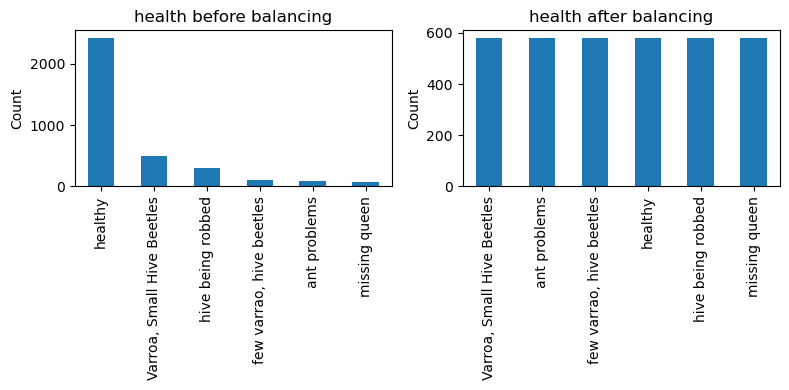

In [55]:
# Split/balance and plot the result
train_bees_bal, val_bees, test_bees = split_balance(honey_bee_df, 'health')
plot_balanced(train_bees, train_bees_bal, 'health')

# Will use balanced dataset as main
train_bees_bal = train_bees

In [56]:
# Call image preparation and one hot encoding from Bee subspecies section
generator, train_X, val_X, test_X, train_y, val_y, test_y = prepare2train(train_bees, val_bees, test_bees, 'health')

In [57]:
# We'll stop training if no improvement after some epochs
earlystopper2 = EarlyStopping(monitor='val_acc', patience=10, verbose=1)

# Save the best model during the traning
checkpointer2 = ModelCheckpoint('best_model2.h5'
                                ,monitor='val_acc'
                                ,verbose=1
                                ,save_best_only=True
                                ,save_weights_only=True)
# Build CNN model
model2=Sequential()
model2.add(Conv2D(5, kernel_size=3, input_shape=(IMAGE_WIDTH , IMAGE_HEIGHT ,3), activation='relu', padding='same'))
model2.add(MaxPool2D(2))
model2.add(Conv2D(10, kernel_size=3, activation='relu', padding='same'))
model2.add(Flatten())
model2.add(Dense(train_y.columns.size, activation='softmax'))
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train
training2 = model2.fit_generator(generator.flow(train_X,train_y, batch_size=60)
                        ,epochs=20
                        ,validation_data=[val_X, val_y]
                        ,steps_per_epoch=50
                        ,callbacks=[earlystopper2, checkpointer2])


Epoch 1/20


C:\Users\Mamoon\AppData\Local\Temp\ipykernel_27176\4030120293.py:20: UserWarning:

`Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.



50/50 [==============================] - 5s 85ms/step - loss: 0.8190 - accuracy: 0.7481 - val_loss: 1.0744 - val_accuracy: 0.6392
Epoch 2/20
50/50 [==============================] - 4s 84ms/step - loss: 0.5743 - accuracy: 0.8215 - val_loss: 0.9069 - val_accuracy: 0.6856
Epoch 3/20
50/50 [==============================] - 4s 82ms/step - loss: 0.4884 - accuracy: 0.8411 - val_loss: 0.9625 - val_accuracy: 0.7139
Epoch 4/20
50/50 [==============================] - 4s 84ms/step - loss: 0.4666 - accuracy: 0.8612 - val_loss: 0.8066 - val_accuracy: 0.7268
Epoch 5/20
50/50 [==============================] - 4s 83ms/step - loss: 0.4356 - accuracy: 0.8615 - val_loss: 0.6956 - val_accuracy: 0.7242
Epoch 6/20
50/50 [==============================] - 4s 83ms/step - loss: 0.3971 - accuracy: 0.8693 - val_loss: 0.7080 - val_accuracy: 0.7268
Epoch 7/20
50/50 [==============================] - 4s 83ms/step - loss: 0.3897 - accuracy: 0.8697 - val_loss: 0.7425 - val_accuracy: 0.7552
Epoch 8/20
50/50 [======

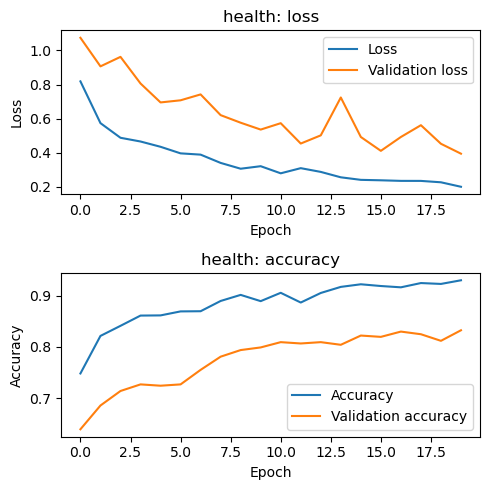

41/41 [==============================] - 0s 7ms/step


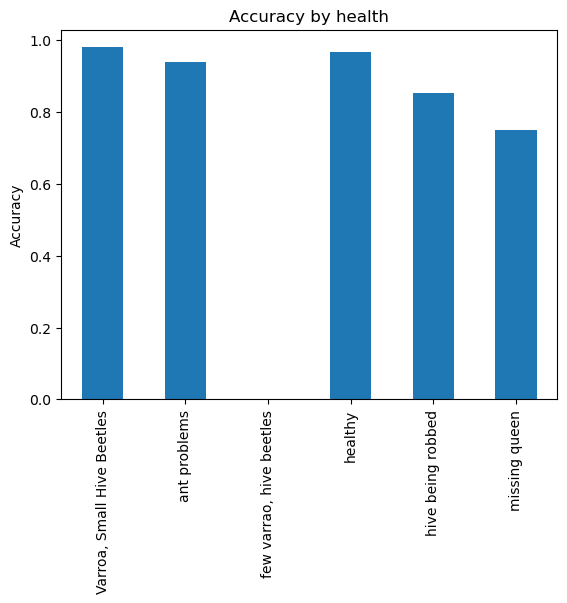

Classification report
                            precision    recall  f1-score   support

Varroa, Small Hive Beetles       0.47      0.99      0.64       102
              ant problems       0.94      0.95      0.94       117
  few varrao, hive beetles       0.75      0.02      0.04       139
                   healthy       0.96      0.98      0.97       866
         hive being robbed       0.81      0.89      0.84        61
             missing queen       1.00      0.88      0.93         8

                  accuracy                           0.87      1293
                 macro avg       0.82      0.78      0.73      1293
              weighted avg       0.89      0.87      0.83      1293

Loss function: 0.3484765887260437, accuracy: 0.8669760227203369


In [58]:
# Call evaluation with charts, defined in Bee subspecies section
eval_model(training2, model2, test_X, test_y, 'health')

# Visualization of Convolutional Kernels

In this section, we visualize the convolutional kernels of the trained Convolutional Neural Network (CNN) models for both the bee subspecies classification and bee health classification tasks.

These visualizations provide insights into how the kernels in the convolutional layers are capturing different features and patterns in the input images, contributing to the network's ability to make accurate predictions.


In [59]:
# Common function for visualization of kernels
def visualize_layer_kernels(img, conv_layer, title):
    """
    Displays how input sample image looks after convolution by each kernel
    :param img: Sample image array
    :param conv_layer: Layer of Conv2D type
    :param title: Text to display on the top 
    """
    # Extract kernels from given layer
    weights1 = conv_layer.get_weights()
    kernels = weights1[0]
    kernels_num = kernels.shape[3]
    
    # Each row contains 3 images: kernel, input image, output image
    f, ax = plt.subplots(kernels_num, 3, figsize=(7, kernels_num*2))

    for i in range(0, kernels_num):
        # Get kernel from the layer and draw it
        kernel=kernels[:,:,:3,i]
        ax[i][0].imshow((kernel * 255).astype(np.uint8), vmin=0, vmax=255)
        ax[i][0].set_title("Kernel %d" % i, fontsize = 9)
        
        # Get and draw sample image from test data
        ax[i][1].imshow((img * 255).astype(np.uint8), vmin=0, vmax=255)
        ax[i][1].set_title("Before", fontsize=8)
        
        # Filtered image - apply convolution
        img_filt = scipy.ndimage.filters.convolve(img, kernel)
        ax[i][2].imshow((img_filt * 255).astype(np.uint8), vmin=0, vmax=255)
        ax[i][2].set_title("After", fontsize=8)
        
    plt.suptitle(title)
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()   

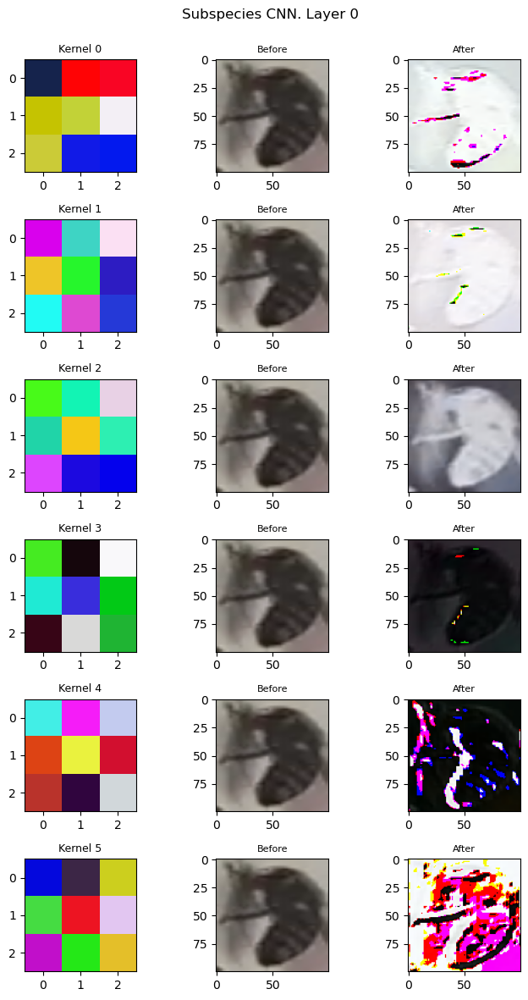

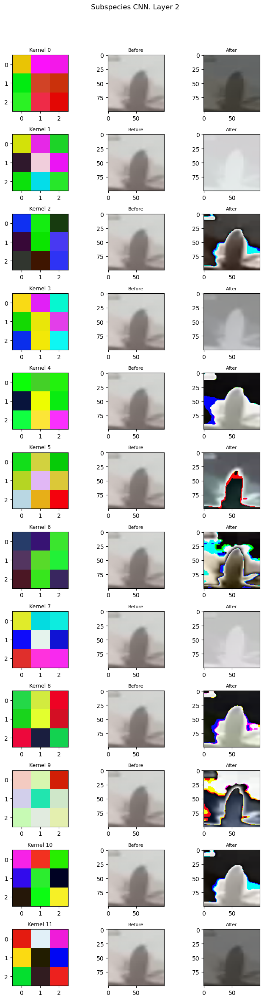

In [60]:
# Take sample image to visualize convolution
idx = random.randint(0,len(test_X)-1)
img = test_X[idx,:,:,:]
# Take 1st convolutional layer and look at it's filters
conv1 = model1.layers[0]
img = visualize_layer_kernels(img, conv1, "Subspecies CNN. Layer 0")

# Take sample image to visualize convolutoin
idx = random.randint(0,len(test_y)-1)
img = test_X[idx,:,:,:]
# Take another convolutional layer and look at it's filters
conv2 = model1.layers[2]
res = visualize_layer_kernels(img, conv2, "Subspecies CNN. Layer 2")


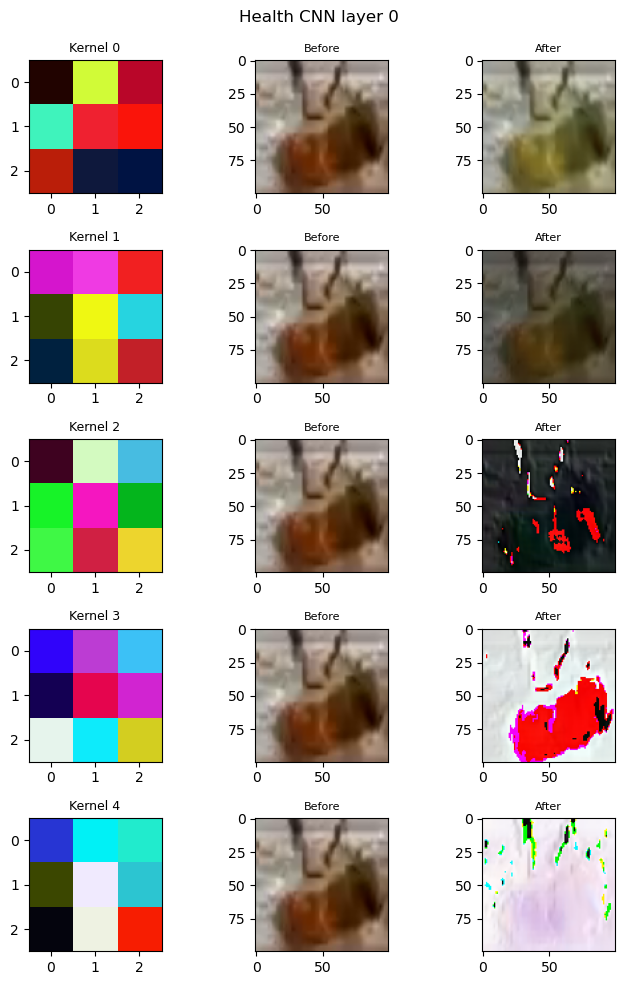

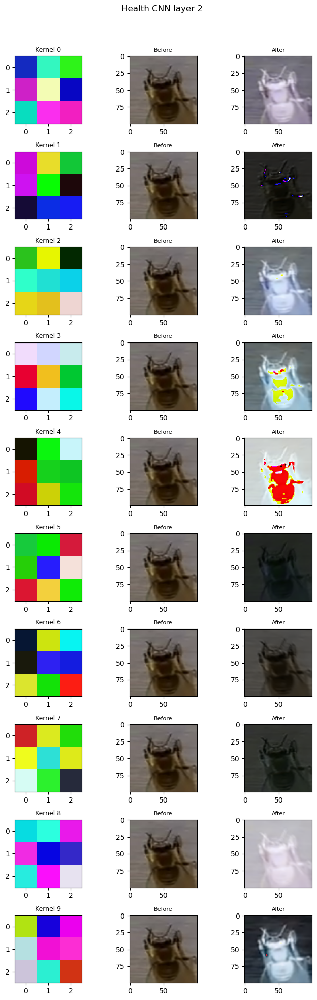

In [61]:
# Take sample image to visualize convolution
idx = random.randint(0,len(test_X)-1)
img = test_X[idx,:,:,:]
#img = img[:,:,:]
# Take 1st convolutional layer and look at it's filters
conv1 = model2.layers[0]
visualize_layer_kernels(img, conv1, "Health CNN layer 0")

# Take sample image to visualize convolutoin
idx = random.randint(0,len(test_X)-1)
img = test_X[idx,:,:,:]
# Take another convolutional layer and look at it's filters
conv2 = model2.layers[2]
visualize_layer_kernels(img, conv2, "Health CNN layer 2")

# Bee Species and Health Classification with CNNs: Summary

In this project, we implemented Convolutional Neural Network (CNN) models to classify bee species and assess bee health based on images of bees. The dataset included images of different bee species and their health conditions, aiming to build models that can accurately identify these attributes.

## Data Preprocessing and Balancing

We began by preprocessing the image data, resizing images to a consistent size, and splitting it into training, validation, and test sets. To address class imbalance, we employed a balancing technique to ensure that each class had a representative number of samples for training.

## Subspecies Classification CNN

We developed a CNN model for classifying bee subspecies. The model architecture included convolutional layers, max-pooling layers, and fully connected layers. The dataset was prepared with one-hot encoding for the target labels, and data augmentation was applied to improve model generalization. The model was trained and evaluated, achieving an accuracy of approximately 81%.

## Health Classification CNN

A separate CNN model was designed to classify bee health conditions. Similar to the subspecies classification, the model architecture was defined with convolutional and fully connected layers. Data preprocessing and augmentation techniques were applied, leading to a model that achieved an accuracy of around 86%.

## Visualizing Convolutional Kernels

We visualized the convolutional kernels of both CNN models to understand how they capture features and patterns from input images. By passing sample images through different convolutional layers, we observed the transformations applied by each kernel, providing insights into the learned features and their contribution to accurate classifications.

## Conclusion

In this project, we successfully implemented CNN models for bee subspecies and health classification tasks. The models demonstrated promising accuracy in identifying bee attributes. Additionally, visualizing the convolutional kernels helped us understand how the models extract meaningful features from the input images, enhancing our insights into the classification process.
